In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Tue_May__3_19:00:59_Pacific_Daylight_Time_2022
Cuda compilation tools, release 11.7, V11.7.64
Build cuda_11.7.r11.7/compiler.31294372_0
torch:  2.0 ; cuda:  cu117
detectron2: 0.6


In [2]:
print(torch.cuda.is_available())
print(torch.cuda.get_device_name(0))

True
NVIDIA GeForce RTX 3050 Ti Laptop GPU


In [3]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [5]:
!cd r"C:\Users\atamr\OneDrive\Pictures\Presentasi Asset Computer Vision"

C:\Users\atamr\OneDrive\Pictures\Presentasi Asset Computer Vision


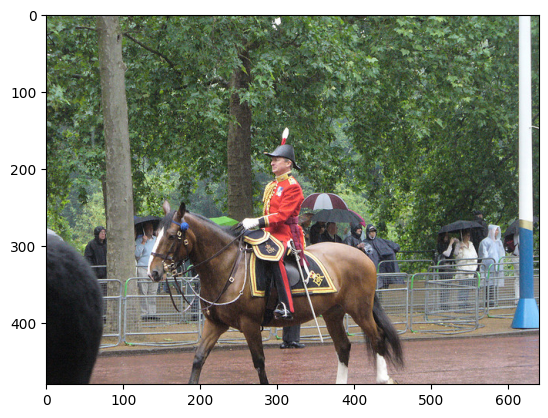

In [13]:
im = cv2.imread("./kuda.png")
im = cv2.cvtColor(im , cv2.COLOR_BGR2RGB)
plt.imshow(im)

In [14]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
predictor = DefaultPredictor(cfg)
outputs = predictor(im)

[09/11 12:32:55 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl ...


model_final_f10217.pkl: 178MB [00:20, 8.87MB/s]                              
D:\Python Test\Detectron-CVE\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


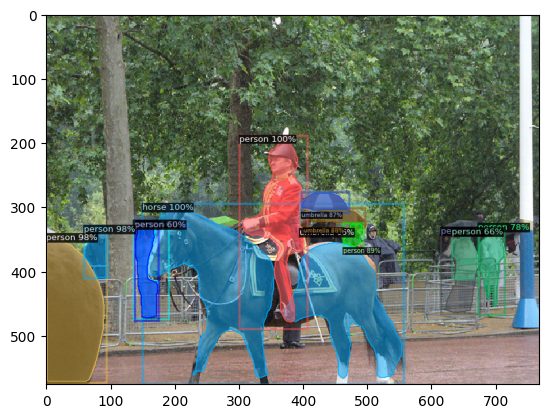

In [16]:
# We can use `Visualizer` to draw the predictions on the image.
v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.2)
out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.imshow(out.get_image()[:, :, ::-1])

 Volume in drive C is Windows-SSD
 Volume Serial Number is EA54-958E

 Directory of C:\Users\atamr\OneDrive\Pictures\Presentasi Asset Computer Vision

11/09/2023  12:25    <DIR>          .
10/09/2023  03:59    <DIR>          ..
11/09/2023  12:17       424.041.646 [4K] Shanghai Drive _ Downtown Shanghai _ Jing'an & Huangpu District _ China.mp4
10/09/2023  04:00           215.410 0_mbFcPiN-Y5IOFFyD.jpg
10/09/2023  04:00           588.177 1_8gmgaAkFdI-9OHY5cA93xQ.png
11/09/2023  12:25           725.085 download.png
10/09/2023  04:00           665.409 LPR-main-imagepoc-1024x550-copy.png
11/09/2023  12:13       964.235.546 OneDrive_1_9-11-2023.zip
               6 File(s)  1.390.471.273 bytes
               2 Dir(s)  156.912.570.368 bytes free


In [6]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
def get_gulma_dicts(directory):
    classes = ['pipih', 'lebar', 'majemuk']
    dataset_dicts = []
    for idx, filename in enumerate([file for file in os.listdir(directory) if file.endswith('.json')]):
        json_file = os.path.join(directory, filename)
        with open(json_file) as f:
            img_anns = json.load(f)

        record = {}

        filename = os.path.join(directory, img_anns["imagePath"])
        image = cv2.imread(filename)
        if image is None:
            print(f"Error: Could not read image '{filename}'")
            continue

        height, width = image.shape[:2]

        record["file_name"] = filename
        record["image_id"] = idx
        record["height"] = height
        record["width"] = width

        annos = img_anns["shapes"]
        objs = []
        for anno in annos:
            px = [a[0] for a in anno['points']]
            py = [a[1] for a in anno['points']]
            poly = [(x, y) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]

            obj = {
                "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": classes.index(anno['label']),
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts


In [7]:
from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "test","validation"]:
    DatasetCatalog.register("gulma1_" + d, lambda d=d: get_gulma_dicts('gulma/' + d))
    MetadataCatalog.get("gulma1_" + d).set(thing_classes=['pipih', 'lebar', 'majemuk'])


In [8]:
gulma_metadata = MetadataCatalog.get("gulma1_train")

In [9]:
dataset_dicts = get_gulma_dicts("gulma/train")

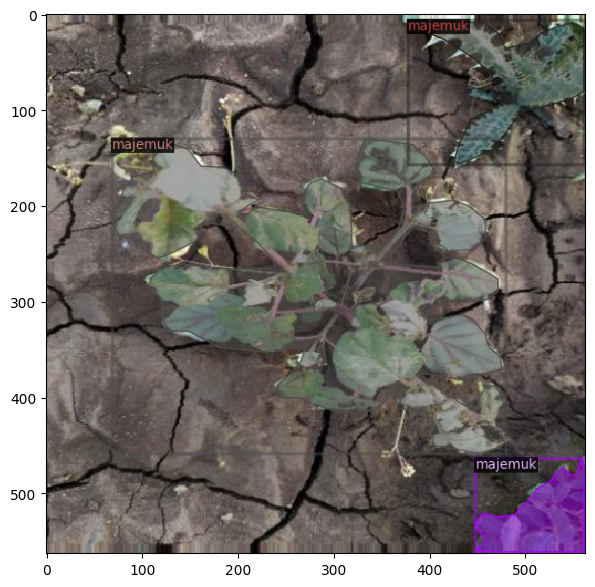

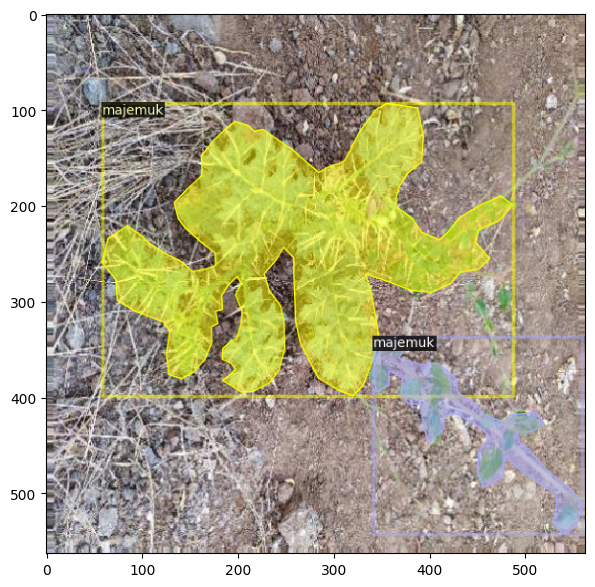

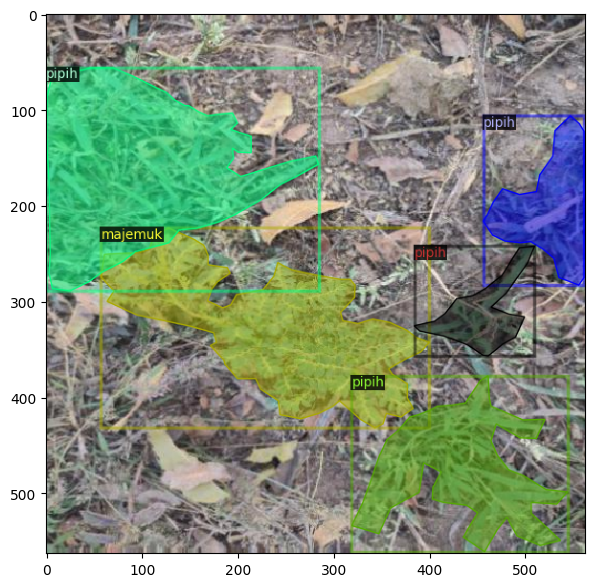

In [10]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=gulma_metadata, scale=1.1)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (7, 7))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [11]:
#Splitting Data dan add model

cfg = get_cfg()
model = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_1x.yaml"
cfg.merge_from_file(model_zoo.get_config_file(model))
cfg.DATASETS.TRAIN = ("gulma1_train",)
cfg.DATASETS.VAL = ("gulma1_validation",)
cfg.DATASETS.TEST = ("gulma1_test",)

In [12]:
#Custom validation loss
from detectron2.engine import HookBase
from detectron2.data import build_detection_train_loader
import detectron2.utils.comm as comm
import torch


class ValidationLoss(HookBase):
    """
    A hook that computes validation loss during training.

    Attributes:
        cfg (CfgNode): The detectron2 config node.
        _loader (iterator): An iterator over the validation dataset.
    """

    def __init__(self, cfg):
        """
        Args:
            cfg (CfgNode): The detectron2 config node.
        """
        super().__init__()
        self.cfg = cfg.clone()
        # Switch to the validation dataset
        self.cfg.DATASETS.TRAIN = cfg.DATASETS.VAL
        # Build the validation data loader iterator
        self._loader = iter(build_detection_train_loader(self.cfg))

    def after_step(self):
        """
        Computes the validation loss after each training step.
        """
        # Get the next batch of data from the validation data loader
        data = next(self._loader)
        with torch.no_grad():
            # Compute the validation loss on the current batch of data
            loss_dict = self.trainer.model(data)

            # Check for invalid losses
            losses = sum(loss_dict.values())
            assert torch.isfinite(losses).all(), loss_dict

            # Reduce the loss across all workers
            loss_dict_reduced = {"val_" + k: v.item() for k, v in
                                 comm.reduce_dict(loss_dict).items()}
            losses_reduced = sum(loss for loss in loss_dict_reduced.values())

            # Save the validation loss in the trainer storage
            if comm.is_main_process():
                self.trainer.storage.put_scalars(total_val_loss=losses_reduced,
                                                 **loss_dict_reduced)


In [13]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg


#Konfigurasi hyperparameter
check_point = 500
data_loader_worker = 2
batch_size = 2
learning_rate = 0.00002
epochs = 7500
batch_size_ROI = 128
class_detection = 4 #n+1

#Hyperparamter konfigurasi
cfg.SOLVER.CHECKPOINT_PERIOD = check_point
cfg.DATALOADER.NUM_WORKERS = data_loader_worker
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model)
cfg.SOLVER.IMS_PER_BATCH = batch_size
cfg.SOLVER.BASE_LR = learning_rate
cfg.SOLVER.MAX_ITER = epochs
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = batch_size_ROI
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = class_detection

#Validation
trainer = DefaultTrainer(cfg)
# Create a custom validation loss object
val_loss = ValidationLoss(cfg)
# Register the custom validation loss object as a hook to the trainer
trainer.register_hooks([val_loss])
# Swap the positions of the evaluation and checkpointing hooks so that the validation loss is logged correctly
trainer._hooks = trainer._hooks[:-2] + trainer._hooks[-2:][::-1]

#Train
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer.resume_or_load(resume=False)
trainer.train()

[08/18 12:39:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (4, 256, 1, 1) 

[08/18 12:39:13 d2.engine.train_loop]: Starting training from iteration 0


D:\Python Test\Detectron-CVE\lib\site-packages\torch\functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[08/18 12:39:38 d2.utils.events]:  eta: 0:39:58  iter: 19  total_loss: 3.036  loss_cls: 1.528  loss_box_reg: 0.7215  loss_mask: 0.692  loss_rpn_cls: 0.03839  loss_rpn_loc: 0.0142  total_val_loss: 3.139  val_loss_cls: 1.53  val_loss_box_reg: 0.7536  val_loss_mask: 0.6923  val_loss_rpn_cls: 0.1263  val_loss_rpn_loc: 0.02407    time: 0.3811  last_time: 0.3421  data_time: 0.0900  last_data_time: 0.0015   lr: 3.9962e-07  max_mem: 2440M
[08/18 12:39:48 d2.utils.events]:  eta: 0:40:43  iter: 39  total_loss: 3.235  loss_cls: 1.521  loss_box_reg: 0.7956  loss_mask: 0.6922  loss_rpn_cls: 0.1987  loss_rpn_loc: 0.03508  total_val_loss: 3.154  val_loss_cls: 1.525  val_loss_box_reg: 0.7502  val_loss_mask: 0.6918  val_loss_rpn_cls: 0.111  val_loss_rpn_loc: 0.01785    time: 0.3508  last_time: 0.3530  data_time: 0.0011  last_data_time: 0.0011   lr: 7.9922e-07  max_mem: 2440M
[08/18 12:39:59 d2.utils.events]:  eta: 0:39:49  iter: 59  total_loss: 3.028  loss_cls: 1.491  loss_box_reg: 0.7413  loss_mask: 0

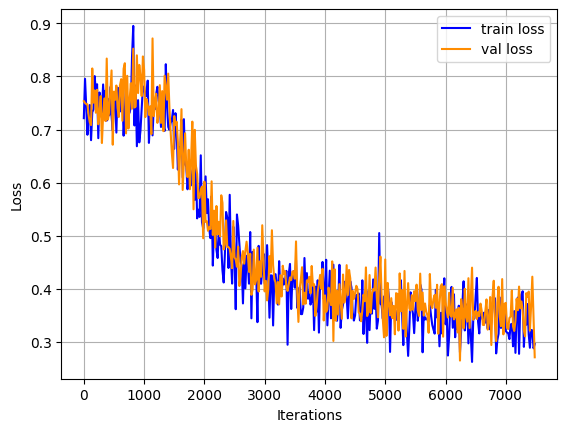

In [14]:
import ast
import json

import matplotlib.pyplot as plt
import numpy as np

metrics_file = 'output/metrics.json'


def moving_average(a, n=3):
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n




with open(metrics_file, 'r') as f:
    metrics = [ast.literal_eval(l[:-1]) for l in f.readlines()]

train_loss = [float(v['loss_box_reg']) for v in metrics if 'loss_box_reg' in v.keys()]
val_loss = [float(v['val_loss_box_reg']) for v in metrics if 'val_loss_box_reg' in v.keys()]

N = 70
train_loss_avg = moving_average(train_loss, n=N)
val_loss_avg = moving_average(val_loss, n=N)


plt.plot(range(0, 20*len(train_loss),20), train_loss, label='train loss', c='blue')
plt.plot(range(0, 20*len(train_loss),20), val_loss, label='val loss', c='darkorange')

plt.xlabel('Iterations')
plt.ylabel('Loss')

plt.legend()
plt.grid()
plt.show()


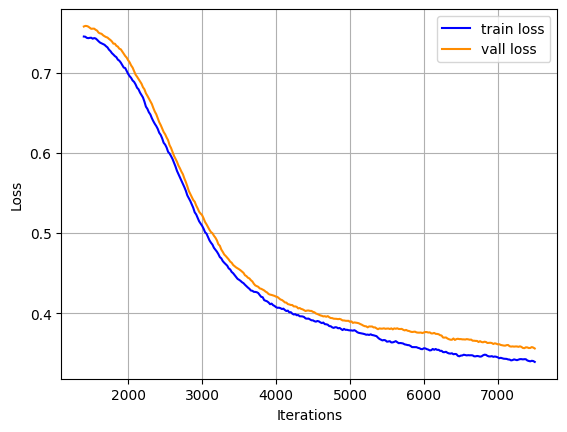

In [15]:
plt.plot(range(20 * N - 1, 20 * len(train_loss), 20), train_loss_avg, label='train loss', c='blue')
plt.plot(range(20 * N - 1, 20 * len(train_loss), 20), val_loss_avg, label='vall loss', c='darkorange')


plt.xlabel('Iterations')
plt.ylabel('Loss')

plt.legend()
plt.grid()
plt.show()

In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

[08/18 13:40:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...


In [18]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("gulma1_train", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "gulma1_train")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/18 13:42:35 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/18 13:42:35 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/18 13:42:35 d2.data.common]: Serializing 388 elements to byte tensors and concatenating them all ...
[08/18 13:42:35 d2.data.common]: Serialized dataset takes 1.27 MiB
[08/18 13:42:35 d2.evaluation.evaluator]: Start inference on 388 batches
[08/18 13:42:38 d2.evaluation.evaluator]: Inference done 11/388. Dataloading: 0.0003 s/iter. Inference: 0.0789 s/iter. Eval: 0.0024 s/iter. Total: 0.0816 s/iter. ETA=0:00:30
[08/18 13:42:43 d2.evaluation.evaluator]: Inference done 73/388. Dataloading: 0.0004 s/iter. Inference: 0.0792 s/iter. Eval: 0.0022 s/iter. Total: 0.0818 s/iter. ETA=0:00:25
[08/18 13:42:48 d2.evaluation.evaluator]: Inference done 134/388. Dataloading: 0.0005 s/iter. Inference: 0.079

In [19]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("gulma1_validation", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "gulma1_validation")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/18 13:43:20 d2.evaluation.coco_evaluation]: Trying to convert 'gulma1_validation' to COCO format ...
[08/18 13:43:20 d2.data.datasets.coco]: Converting annotations of dataset 'gulma1_validation' to COCO format ...)
[08/18 13:43:20 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[08/18 13:43:20 d2.data.datasets.coco]: Conversion finished, #images: 72, #annotations: 314
[08/18 13:43:20 d2.data.datasets.coco]: Caching COCO format annotations at './output\gulma1_validation_coco_format.json' ...
[08/18 13:43:20 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/18 13:43:20 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/18 13:43:20 d2.data.common]: Serializing 72 elements to byte tensors and concatenating them all ...
[08/18 13:43:20 d2.data.common]: Serialized dataset takes 0.25 MiB
[08/18 13:43:2

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("gulma1_test", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "gulma1_test")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[08/18 13:43:29 d2.evaluation.coco_evaluation]: Trying to convert 'gulma1_test' to COCO format ...
[08/18 13:43:29 d2.data.datasets.coco]: Converting annotations of dataset 'gulma1_test' to COCO format ...)
[08/18 13:43:29 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[08/18 13:43:29 d2.data.datasets.coco]: Conversion finished, #images: 26, #annotations: 128
[08/18 13:43:29 d2.data.datasets.coco]: Caching COCO format annotations at './output\gulma1_test_coco_format.json' ...
[08/18 13:43:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/18 13:43:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[08/18 13:43:29 d2.data.common]: Serializing 26 elements to byte tensors and concatenating them all ...
[08/18 13:43:29 d2.data.common]: Serialized dataset takes 0.10 MiB
[08/18 13:43:29 d2.evaluation.ev

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.DATASETS.TEST = ("gulma2_test", )
predictor = DefaultPredictor(cfg)

[08/18 13:43:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output\model_final.pth ...


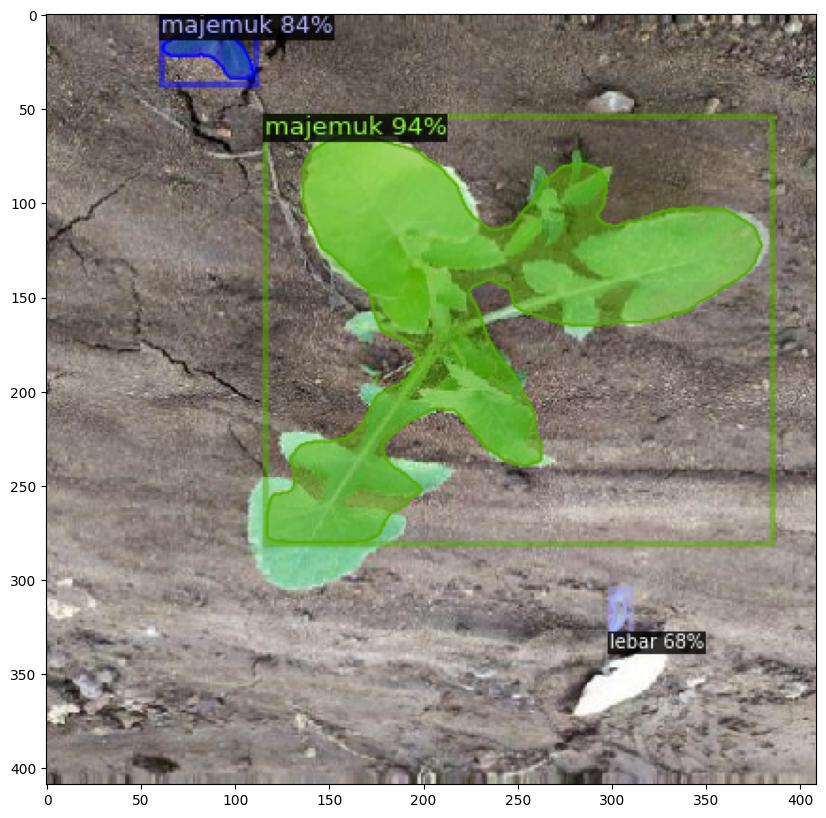

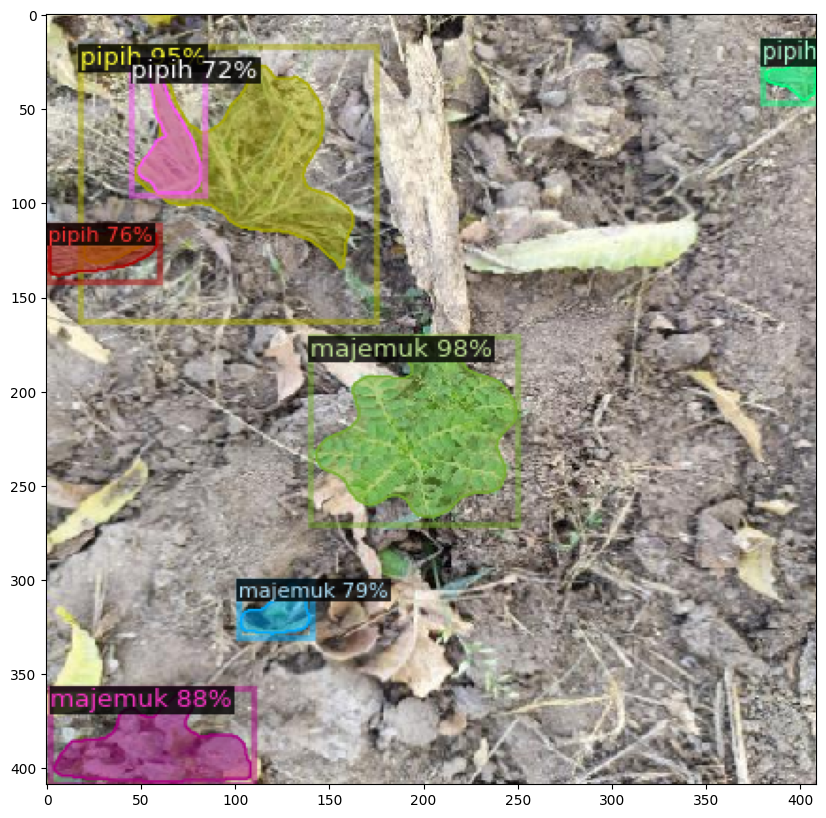

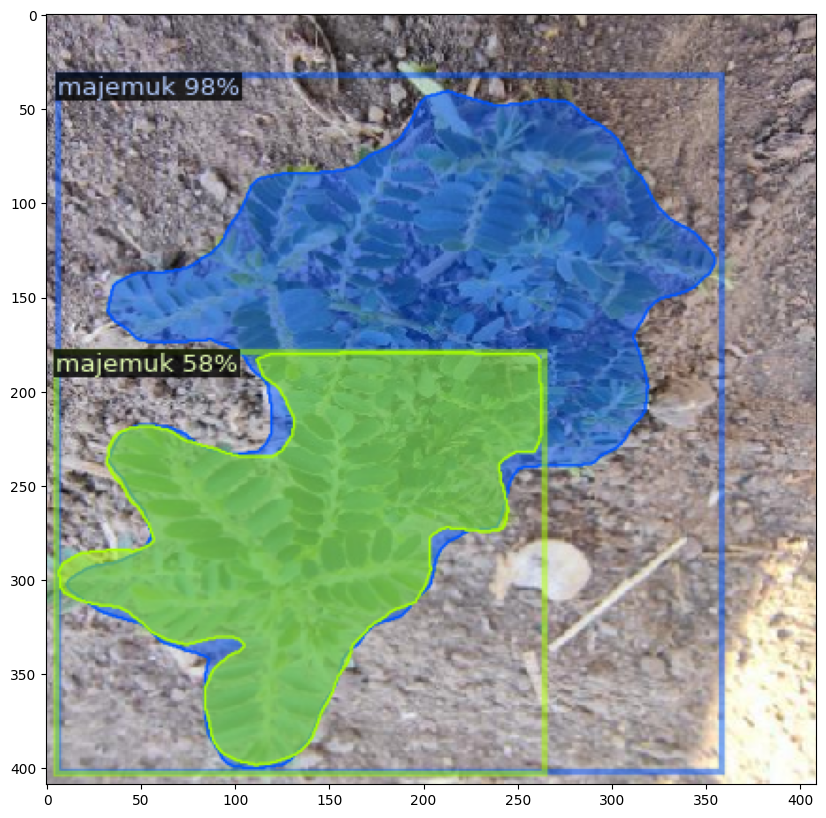

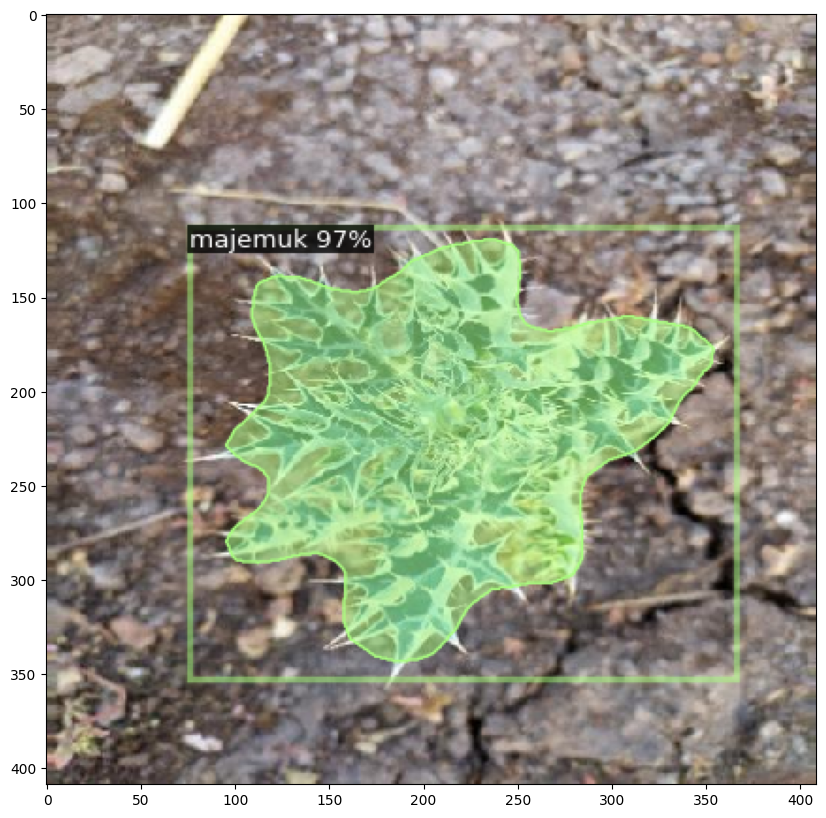

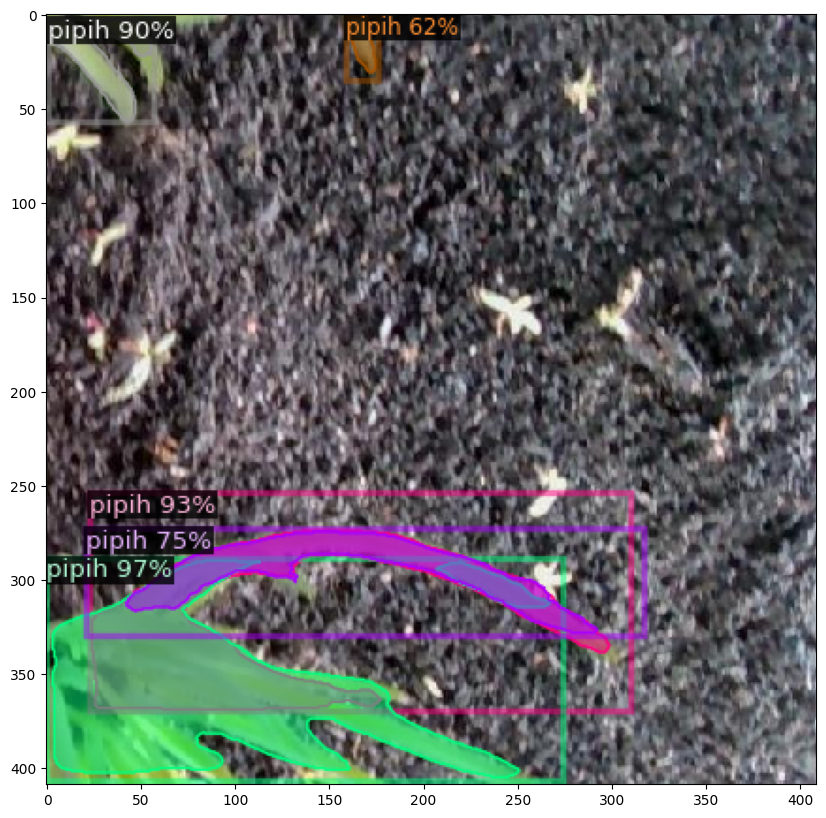

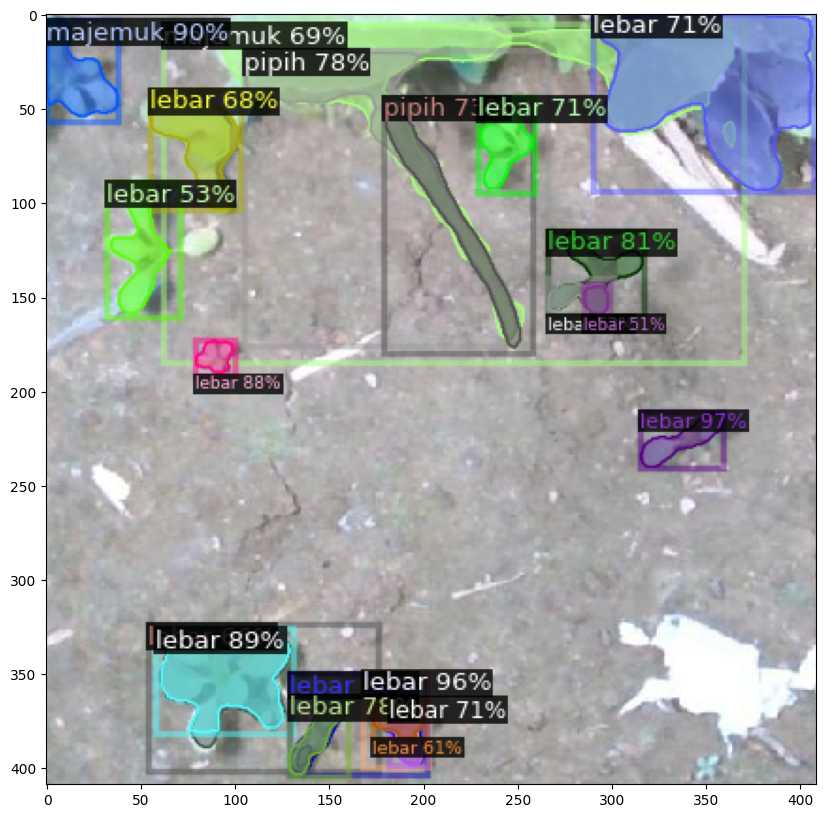

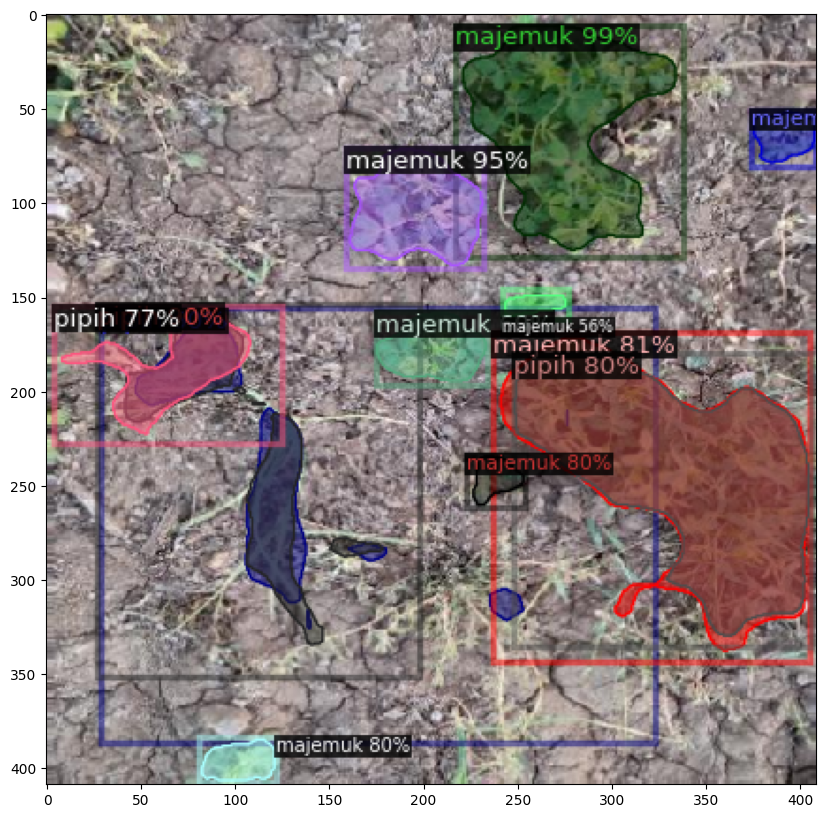

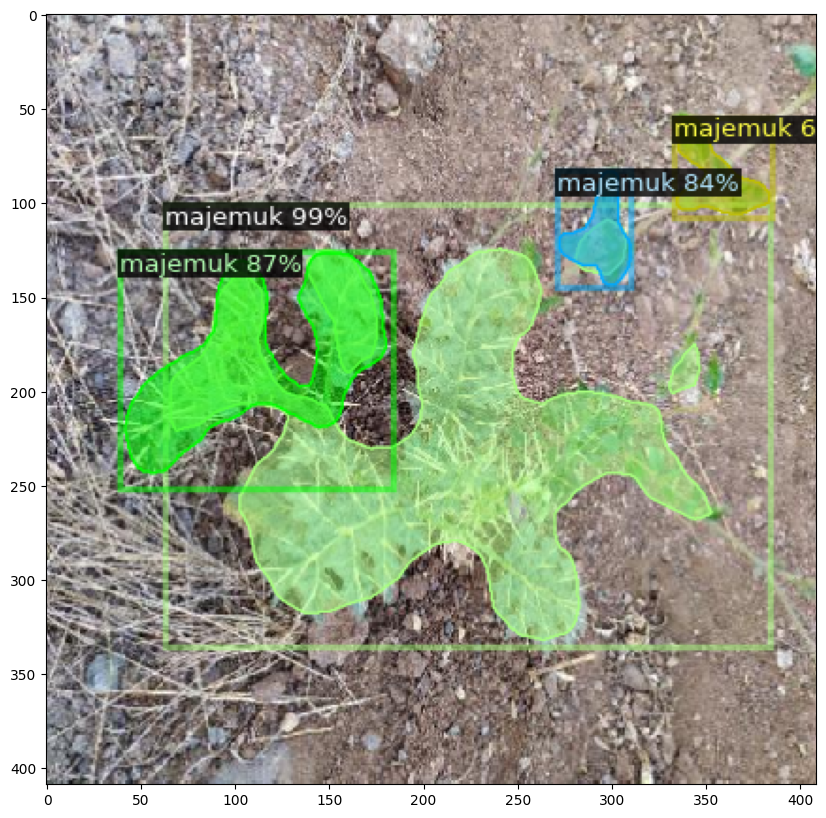

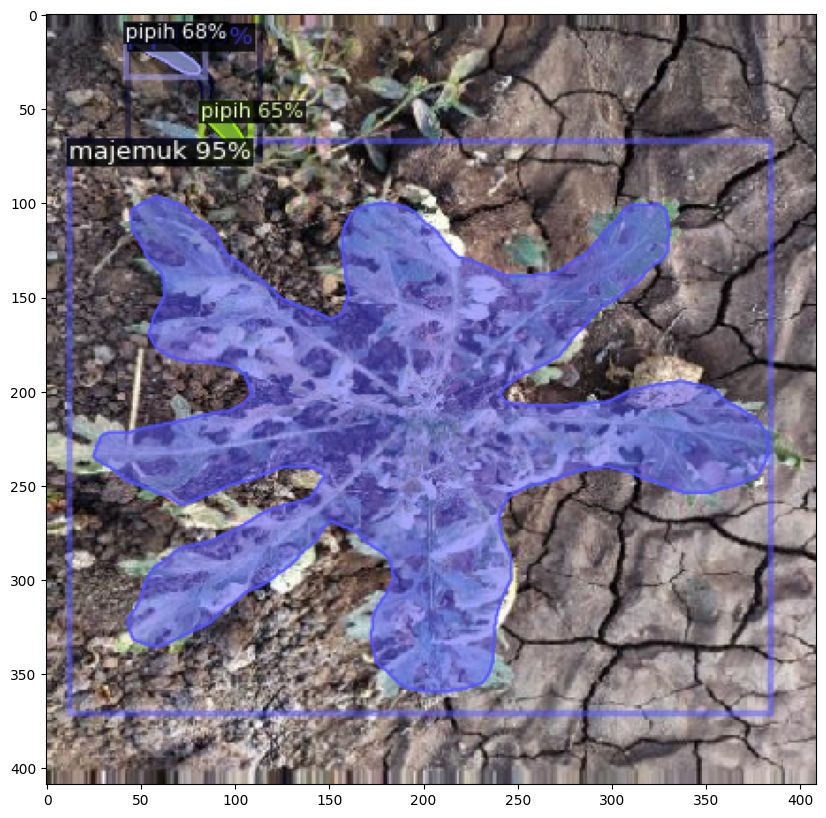

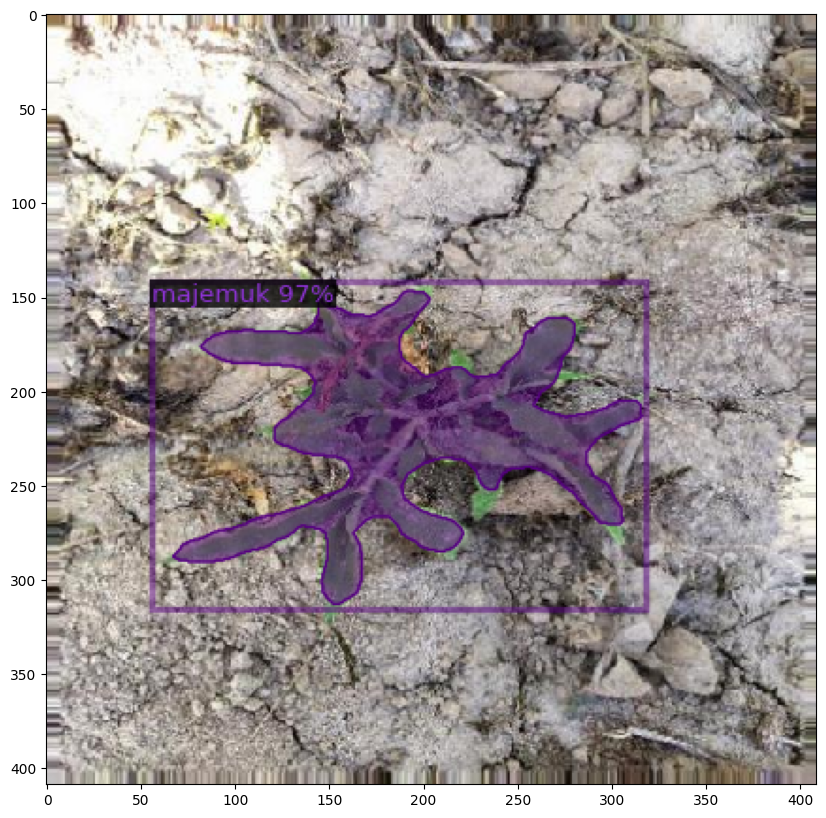

In [22]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_gulma_dicts('gulma/test')
for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=gulma_metadata,
                   scale=0.8,
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()